#  Análise Exploratória de Dados - Análise Bivariada: The Movies Dataset

In [1]:
# Configuração do Jupyter (Autoreload)
%load_ext autoreload
%autoreload 2

# Configuração de Caminho (Path Setup)
import sys
import os

# Adiciona a pasta raiz do projeto (..) ao sistema para liberar os imports locais
sys.path.append(os.path.abspath(os.path.join('..')))

# Importação de Bibliotecas e Módulos
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Módulos customizados da pasta src/
import src.io.data_loader as dl
import src.utils.data_quality as dq
import src.utils.metrics as mt
import src.view.plots as graf
import src.view.tables as tb
import src.utils.reshaping as rsh

---

## Carregando Dados

In [2]:
caminho = '../data/interim/movies/movies_enriched.parquet'
df_movies = dl.load_data(file_path=caminho, tipo_arquivo='parquet')

Dados Parquet carregados! Formato: (41091, 22)


--- 
## Mitigação Temporária De Erros De Preenchimento

* Filtrando orçamentos e faturamentos irreais (**< 5 mil**) para evitar distorções severas nas análises relacionais e multivariadas.


In [3]:
filtro_valores_reais = (df_movies['budget'] >= 5_000) & (df_movies['revenue'] >= 5_000)

df_movies = df_movies[filtro_valores_reais].copy()

---
## Numérica VS Numérica

In [4]:
display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='pearson')['total_votes']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Pearson)'
))

display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='spearman')['total_votes']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Spearman)'
))

,Correlação
total_votes,1.000000
votes_per_year,0.922818
revenue,0.769448
budget,0.583933
popularity,0.476312
global_score,0.324949
average_rating,0.324949
runtime,0.199255
decade,0.183718
release_year,0.182586


,Correlação
total_votes,1.000000
votes_per_year,0.961456
popularity,0.754111
revenue,0.744517
budget,0.565189
global_score,0.313405
average_rating,0.313405
release_year,0.251561
decade,0.246969
runtime,0.145368


In [5]:
# Passa a lista direto no eixo X
colunas_numericas = df_movies.select_dtypes(include='number').columns

regras_log = {
    'total_votes': {'tipo_dado': 'contagem_milhao', 'usar_log': True},
    'votes_per_year': {'tipo_dado': 'contagem_milhar', 'usar_log': True},
    'popularity': {'tipo_dado': 'popularidade', 'usar_log': True},
    'revenue': {'tipo_dado': 'moeda', 'usar_log': True},
    'budget': {'tipo_dado': 'moeda', 'usar_log': True},
    'global_score': {'tipo_dado': 'nota_100', 'usar_log': False},
    'average_rating': {'tipo_dado': 'nota_10', 'usar_log': False},
    'release_year': {'tipo_dado': None, 'usar_log': False},
    'decade': {'tipo_dado': None, 'usar_log': False},
    'age_years': {'tipo_dado': None, 'usar_log': False},
    'runtime': {'tipo_dado': 'hora_12', 'usar_log': False},
    'id': {'tipo_dado': None, 'usar_log': False}
}

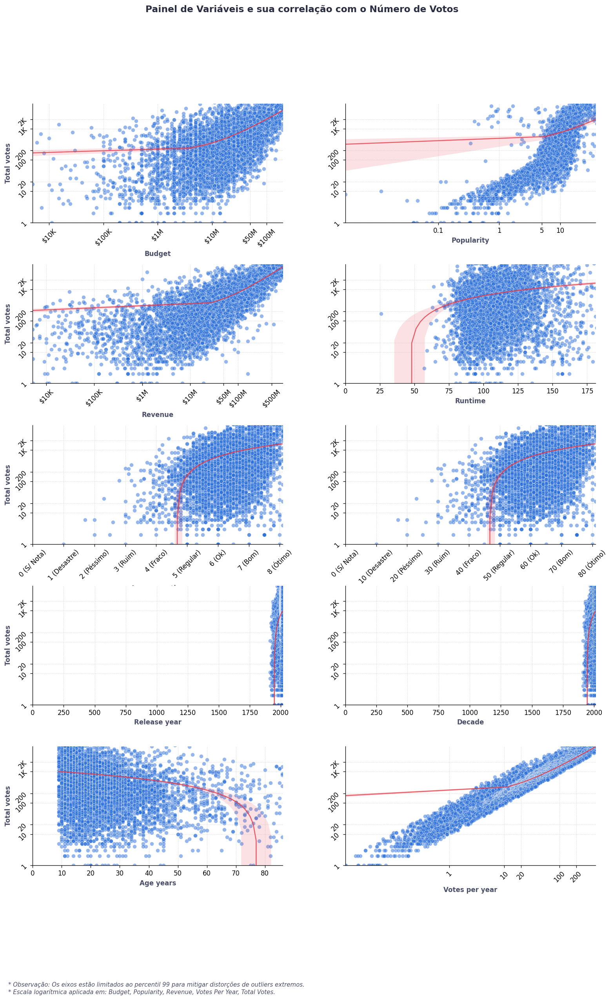

In [6]:
graf.grafico_corr_scatter(
    df_plot=df_movies,
    coluna_x=colunas_numericas.drop(['total_votes', 'id']), 
    coluna_y='total_votes',
    titulo='Painel de Variáveis e sua correlação com o Número de Votos',
    quant_grafs=len(colunas_numericas.drop(['total_votes', 'id'])),
    col_log=regras_log
)

In [7]:
display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='pearson')['average_rating']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Pearson)'
))

display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='spearman')['average_rating']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Spearman)'
))

,Correlação
global_score,1.000000
average_rating,1.000000
runtime,0.335602
total_votes,0.324949
votes_per_year,0.236400
age_years,0.167177
revenue,0.166910
popularity,0.158943
id,-0.005876
budget,-0.017487


,Correlação
global_score,1.000000
average_rating,1.000000
runtime,0.353034
total_votes,0.313405
popularity,0.242514
votes_per_year,0.233380
revenue,0.115923
age_years,0.109736
release_year,-0.109736
decade,-0.122534


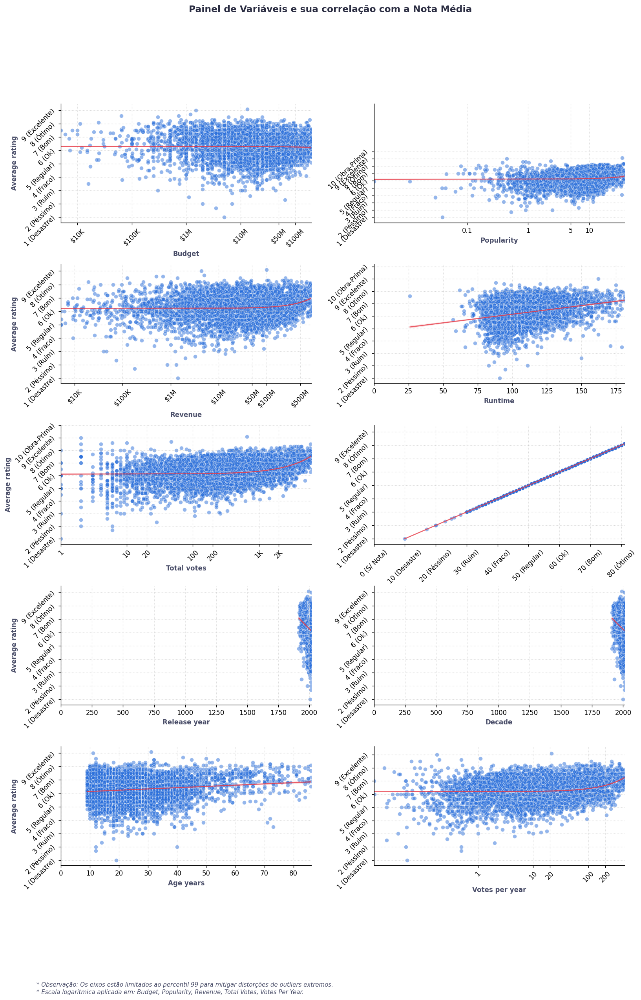

In [8]:
graf.grafico_corr_scatter(
    df_plot=df_movies,
    coluna_x=colunas_numericas.drop(['average_rating', 'id']), 
    coluna_y='average_rating',
    titulo='Painel de Variáveis e sua correlação com a Nota Média',
    quant_grafs=len(colunas_numericas.drop(['average_rating', 'id'])),
    col_log=regras_log
)

In [9]:
display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='pearson')['popularity']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Pearson)'
))

display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='spearman')['popularity']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Spearman)'
))

,Correlação
popularity,1.000000
votes_per_year,0.508956
total_votes,0.476312
revenue,0.438035
budget,0.303848
average_rating,0.158943
global_score,0.158943
id,0.125383
release_year,0.110397
decade,0.101607


,Correlação
popularity,1.000000
total_votes,0.754111
votes_per_year,0.716917
revenue,0.573050
budget,0.469705
global_score,0.242514
average_rating,0.242514
release_year,0.149412
decade,0.130561
runtime,0.124768


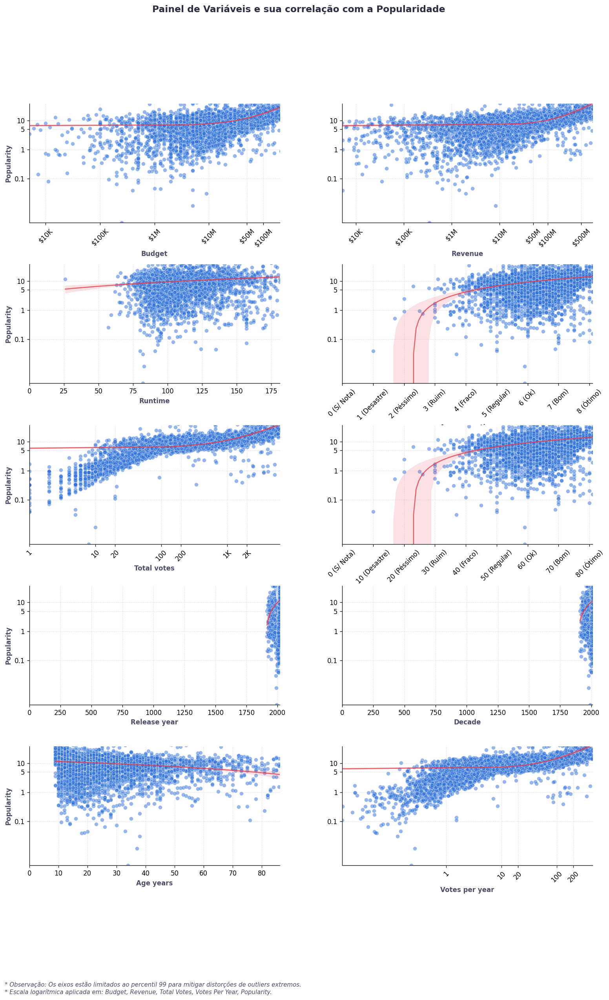

In [10]:
graf.grafico_corr_scatter(
    df_plot=df_movies,
    coluna_x=colunas_numericas.drop(['popularity', 'id']), 
    coluna_y='popularity',
    titulo='Painel de Variáveis e sua correlação com a Popularidade',
    quant_grafs=len(colunas_numericas.drop(['popularity', 'id'])),
    col_log=regras_log
)

In [11]:
display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='pearson')['revenue']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Pearson)'
))

display(tb.estilizar_matriz_correlacao(
    df_corr=df_movies.select_dtypes(include='number')
        .corr(method='spearman')['revenue']
        .sort_values(ascending=False)
        .to_frame(name='Correlação'),
        caption='Mapa de Relacionamento (Correlação Spearman)'
))

,Correlação
revenue,1.000000
total_votes,0.769448
votes_per_year,0.730928
budget,0.728758
popularity,0.438035
runtime,0.187592
global_score,0.166910
average_rating,0.166910
release_year,0.161291
decade,0.158719


,Correlação
revenue,1.000000
total_votes,0.744517
budget,0.701511
votes_per_year,0.698952
popularity,0.573050
runtime,0.214062
decade,0.122876
release_year,0.119529
global_score,0.115923
average_rating,0.115923


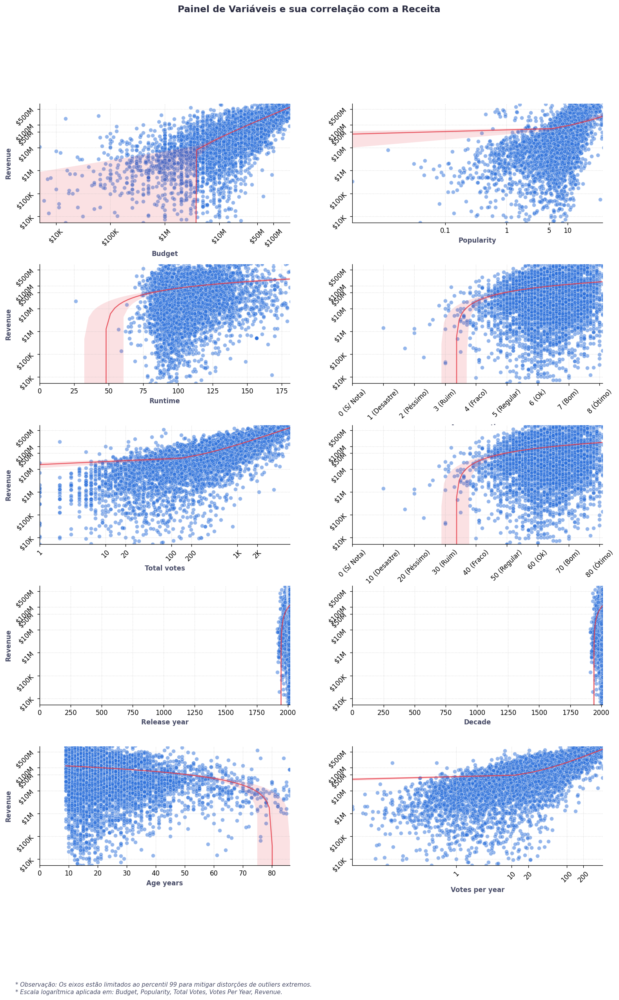

In [12]:
graf.grafico_corr_scatter(
    df_plot=df_movies,
    coluna_x=colunas_numericas.drop(['revenue', 'id']), 
    coluna_y='revenue',
    titulo='Painel de Variáveis e sua correlação com a Receita',
    quant_grafs=len(colunas_numericas.drop(['revenue', 'id'])),
    col_log=regras_log
)

## Categórica VS Categórica

### `genres` vs `producer_company`

In [13]:
contingencia_genres_companies = rsh.gerar_contingencia(
    df=df_movies, 
    coluna_linha='producer_company', 
    coluna_coluna='genres', 
    top_n_linhas=20, 
    top_n_colunas=20
)


display(tb.estilizar_tabela(
    df=contingencia_genres_companies,
    caption='Tabela de Contingência: Top 20 Produtoras vs Top 20 Gêneros'
))

genres,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,Foreign,Gênero Não Identificado,History,Horror,Music,Mystery,Romance,Science Fiction,Thriller,War,Western
producer_company,,,,,,,,,,,,,,,,,,,,
Canal+,29,11,1,21,17,2,56,4,5,0,0,4,6,1,6,11,8,31,6,1
Columbia Pictures,72,46,16,94,34,0,87,27,27,0,0,8,9,5,12,37,22,52,5,4
Columbia Pictures Corporation,33,25,1,46,17,0,56,5,13,0,0,7,12,5,13,27,13,35,9,1
Companhia Não Identificada,26,12,3,64,13,12,83,13,6,7,8,6,9,6,1,36,7,27,1,0
DreamWorks SKG,21,19,10,30,4,0,36,13,6,0,0,5,3,1,7,13,14,18,4,2
Lionsgate,22,10,2,16,15,1,13,3,4,0,0,1,15,0,5,7,10,28,1,1
Metro-Goldwyn-Mayer (MGM),49,41,1,41,29,0,79,6,10,0,0,11,15,12,13,48,16,39,13,6
Miramax Films,10,3,1,40,25,1,61,1,8,0,0,5,5,3,4,32,1,23,3,0
New Line Cinema,49,26,0,78,36,0,55,11,23,0,0,1,39,7,14,31,24,47,0,2


In [14]:
# Executando o Teste do Qui-Quadrado
resultado_genres_companies = mt.testar_dependencia_categorica(
    contingencia_genres_companies
)

display(tb.estilizar_tabela(
    df=resultado_genres_companies,
    caption='Relatório: genres vs production_companies'
))

,Qui-Quadrado,p-valor,Graus de Liberdade
Hipótese Nula ($H_0$),,,
REJEITADA,2158.750309,0.000000,361


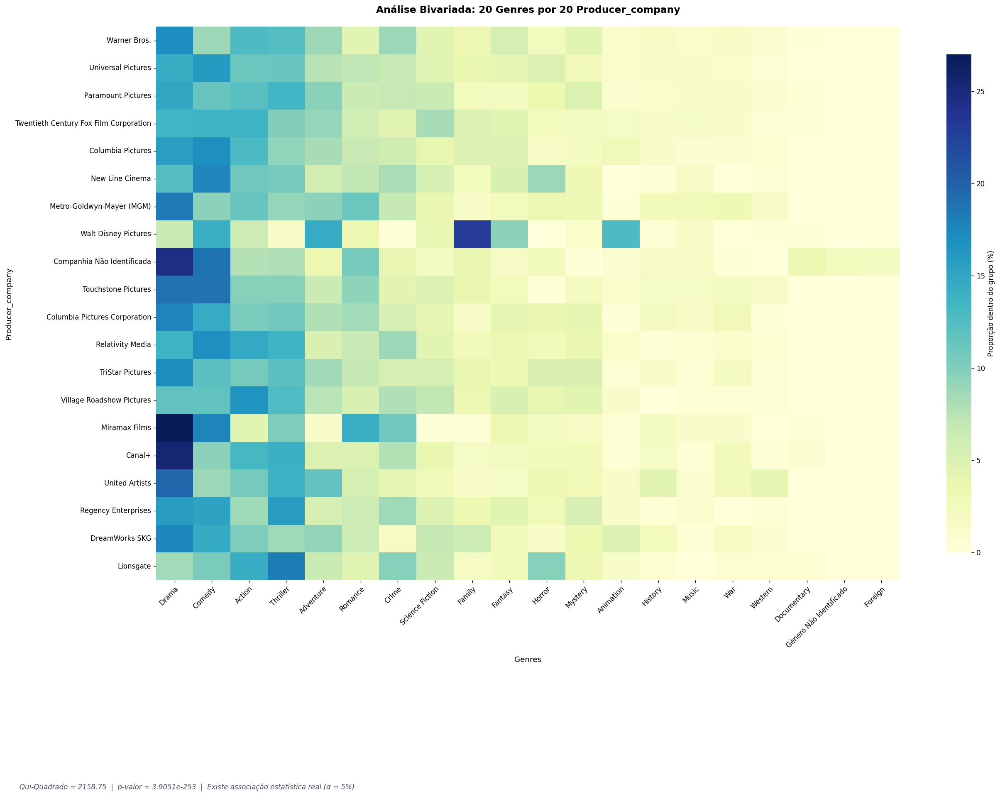

In [15]:
graf.grafico_dependencia_categorica(
    tabela_absoluta=contingencia_genres_companies,
    chi2=resultado_genres_companies['Qui-Quadrado'].iloc[0],
    p_valor=resultado_genres_companies['p-valor'].iloc[0],
    top_n=20
)

### `genres` vs `production_countries`

In [16]:
contingencia_genres_countries = rsh.gerar_contingencia(
    df=df_movies, 
    coluna_linha='production_countries', 
    coluna_coluna='genres', 
    top_n_linhas=20, 
    top_n_colunas=20
)


display(tb.estilizar_tabela(
    df=contingencia_genres_countries,
    caption='Tabela de Contingência: Top 20 Países vs Top 20 Gêneros'
))

genres,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,Foreign,Gênero Não Identificado,History,Horror,Music,Mystery,Romance,Science Fiction,Thriller,War,Western
production_countries,,,,,,,,,,,,,,,,,,,,
Australia,37,25,7,32,11,0,49,15,16,0,0,4,20,2,10,16,26,39,5,2
Belgium,4,7,4,11,4,0,32,5,5,1,0,5,1,1,0,12,1,5,7,1
Canada,71,42,7,52,37,2,97,14,23,0,0,9,60,2,38,28,49,89,8,2
China,47,26,4,16,8,0,36,4,13,0,0,13,1,1,7,7,8,18,9,0
France,98,55,12,89,65,4,213,19,30,1,1,27,30,7,28,69,38,108,20,3
Germany,108,55,8,79,54,4,160,19,36,0,0,23,35,7,34,46,39,119,19,4
Hong Kong,43,18,2,15,11,0,26,5,6,0,0,10,0,0,2,3,9,13,3,3
India,59,14,4,52,25,1,110,8,4,18,1,11,3,6,5,76,12,43,3,0
Ireland,6,5,4,19,5,0,27,5,6,1,0,2,1,3,1,15,2,13,3,0


In [17]:
# Executando o Teste do Qui-Quadrado
resultado_genres_countries = mt.testar_dependencia_categorica(
    contingencia_genres_countries
)

display(tb.estilizar_tabela(
    df=resultado_genres_countries,
    caption='Relatório: genres vs production_countries'
))

,Qui-Quadrado,p-valor,Graus de Liberdade
Hipótese Nula ($H_0$),,,
REJEITADA,2013.633387,0.000000,361


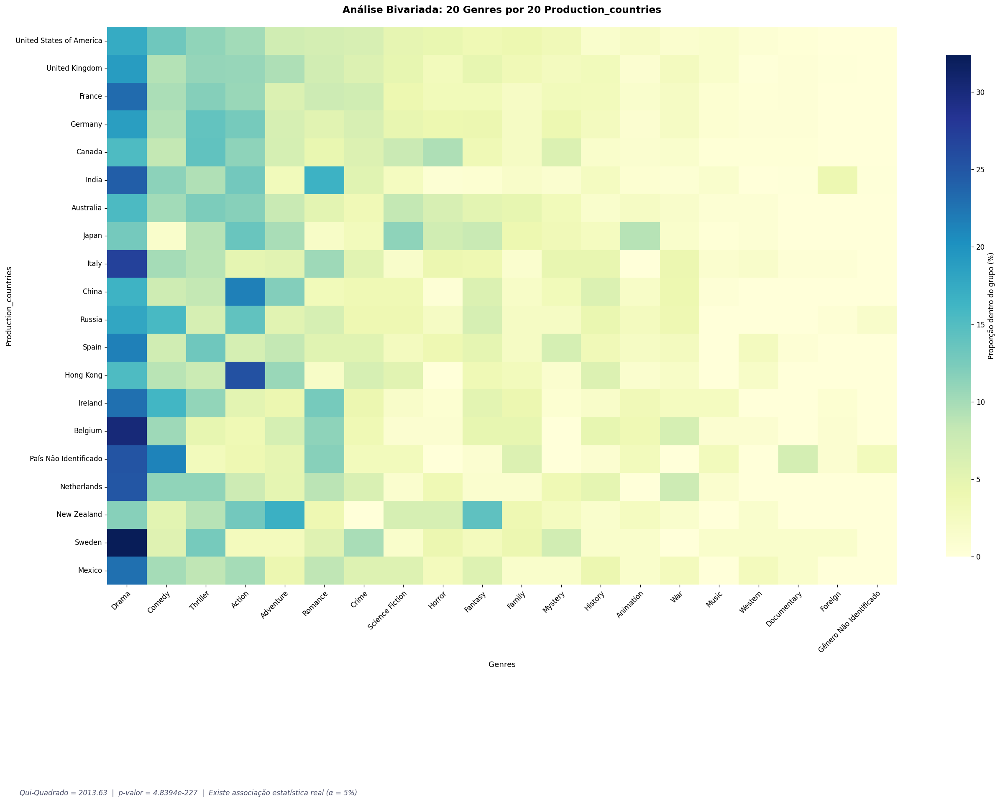

In [18]:
graf.grafico_dependencia_categorica(
    tabela_absoluta=contingencia_genres_countries,
    chi2=resultado_genres_countries['Qui-Quadrado'].iloc[0],
    p_valor=resultado_genres_countries['p-valor'].iloc[0],
    top_n=20
)

### `genres` vs `original_language	`

In [19]:
contingencia_genres_language = rsh.gerar_contingencia(
    df=df_movies, 
    coluna_linha='original_language', 
    coluna_coluna='genres', 
    top_n_linhas=20, 
    top_n_colunas=20
)


display(tb.estilizar_tabela(
    df=contingencia_genres_language,
    caption='Tabela de Contingência: Top 20 Idiomas vs Top 20 Gêneros'
))

genres,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,Foreign,Gênero Não Identificado,History,Horror,Music,Mystery,Romance,Science Fiction,Thriller,War,Western
original_language,,,,,,,,,,,,,,,,,,,,
cn,15,1,0,5,7,0,7,0,1,0,0,5,0,0,0,0,0,5,0,0
da,0,0,0,3,2,0,9,0,0,0,0,1,1,0,1,3,1,3,0,1
de,3,3,1,7,1,1,17,1,1,0,0,3,0,0,0,2,1,4,3,0
en,1236,882,251,1638,781,52,2200,504,461,7,8,187,551,180,409,857,592,1376,162,81
es,6,4,3,9,6,0,23,1,2,0,0,1,5,0,5,7,2,15,1,1
fr,16,9,5,30,8,2,55,4,7,0,0,6,3,1,5,20,5,8,7,0
hi,31,6,0,33,17,0,76,1,0,11,0,6,0,3,3,45,2,19,1,0
it,0,0,0,12,1,0,14,1,1,2,1,2,2,0,2,4,0,2,2,4
ja,13,16,20,1,3,0,13,7,15,0,0,1,7,0,4,1,12,7,0,1


In [20]:
# Executando o Teste do Qui-Quadrado
resultado_genres_language = mt.testar_dependencia_categorica(
    contingencia_genres_language
)

display(tb.estilizar_tabela(
    df=resultado_genres_language,
    caption='Relatório: genres vs original_language'
))

,Qui-Quadrado,p-valor,Graus de Liberdade
Hipótese Nula ($H_0$),,,
REJEITADA,1433.705247,0.000000,361


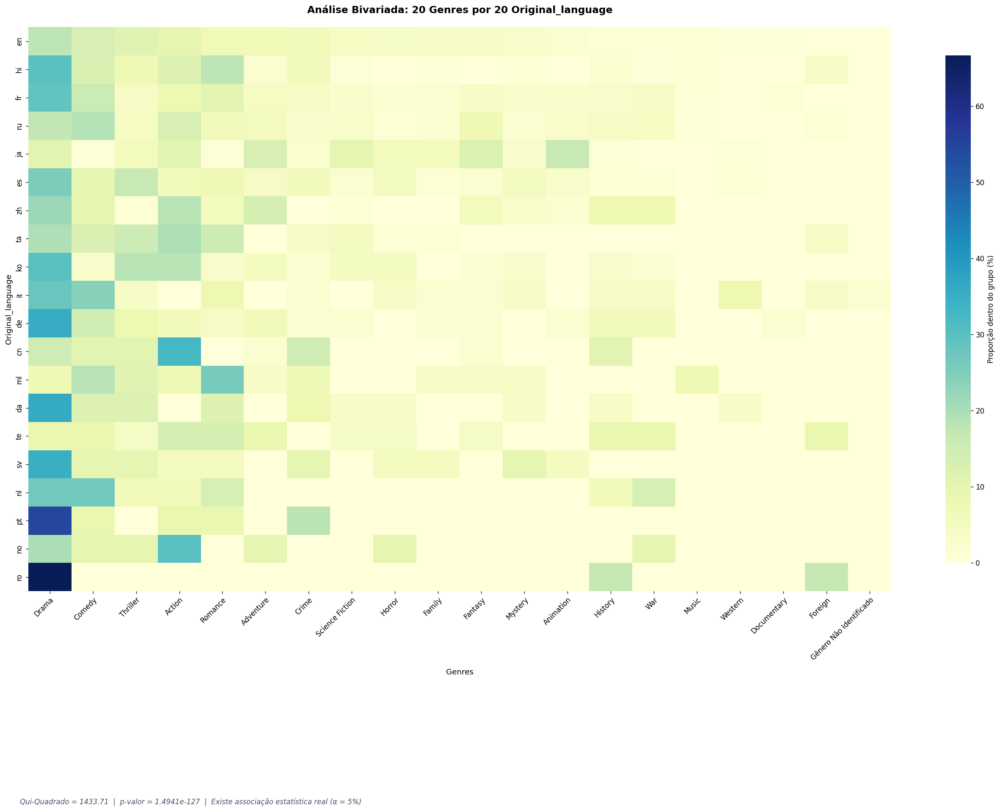

In [21]:
graf.grafico_dependencia_categorica(
    tabela_absoluta=contingencia_genres_language,
    chi2=resultado_genres_language['Qui-Quadrado'].iloc[0],
    p_valor=resultado_genres_language['p-valor'].iloc[0],
    top_n=20
)

### `production_countries` vs `original_language`

In [22]:
contingencia_countries_language = rsh.gerar_contingencia(
    df=df_movies, 
    coluna_linha='original_language', 
    coluna_coluna='production_countries', 
    top_n_linhas=20, 
    top_n_colunas=20
)


display(tb.estilizar_tabela(
    df=contingencia_countries_language,
    caption='Tabela de Contingência: Top 20 Idiomas vs Top 20 Produtoras'
))

production_countries,Australia,Belgium,Canada,China,France,Germany,Hong Kong,India,Ireland,Italy,Japan,Mexico,Netherlands,New Zealand,País Não Identificado,Russia,Spain,Sweden,United Kingdom,United States of America
original_language,,,,,,,,,,,,,,,,,,,,
cn,1,0,0,7,0,0,14,0,0,0,0,0,0,0,0,0,0,0,0,0
da,0,1,0,0,6,7,0,0,0,5,0,0,3,0,0,0,0,9,3,1
de,0,1,0,0,4,18,0,0,0,1,0,0,0,0,0,0,0,0,2,2
en,115,18,222,38,246,262,27,35,43,64,46,16,19,29,41,16,34,12,636,4298
es,0,1,0,0,8,1,0,0,0,2,0,10,1,0,0,0,28,0,0,4
fr,0,14,7,0,80,13,0,0,0,9,1,0,0,0,0,0,5,0,8,6
hi,1,0,0,0,1,1,0,93,0,1,0,0,0,0,3,0,0,0,1,1
it,0,1,0,0,4,3,0,0,1,25,0,0,0,0,0,1,5,0,2,4
ja,0,0,0,0,1,0,0,0,0,0,39,0,0,0,0,0,0,0,2,5


In [23]:
# Executando o Teste do Qui-Quadrado
resultado_countries_language = mt.testar_dependencia_categorica(
    contingencia_countries_language
)

display(tb.estilizar_tabela(
    df=resultado_countries_language,
    caption='Relatório: production_countries vs original_language'
))

,Qui-Quadrado,p-valor,Graus de Liberdade
Hipótese Nula ($H_0$),,,
REJEITADA,22630.953033,0.000000,342


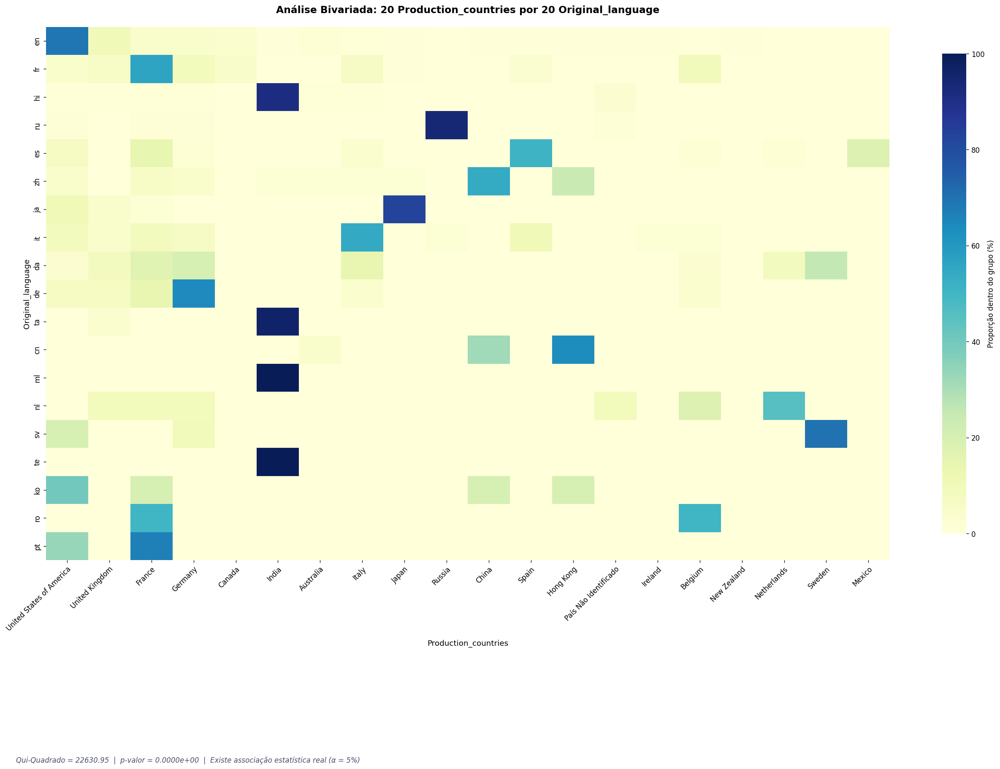

In [24]:
graf.grafico_dependencia_categorica(
    tabela_absoluta=contingencia_countries_language,
    chi2=resultado_countries_language['Qui-Quadrado'].iloc[0],
    p_valor=resultado_countries_language['p-valor'].iloc[0],
    top_n=20
)

#### `genres` vs `popularity_tier`

In [25]:
contingencia_genres_popularity_tier = rsh.gerar_contingencia(
    df=df_movies, 
    coluna_linha='genres', 
    coluna_coluna='popularity_tier', 
    top_n_linhas=20, 
    top_n_colunas=20
)


display(tb.estilizar_tabela(
    df=contingencia_genres_popularity_tier,
    caption='Tabela de Contingência: Top 20 Gêneros vs Top 20 Níveis de Popularidade'
))

popularity_tier,Hidden Gem / Cult,Mainstream Hit,Mass Appeal,Nicho
genres,,,,
Action,13,759,597,29
Adventure,9,554,379,11
Animation,3,201,84,3
Comedy,42,933,772,64
Crime,8,577,246,18
Documentary,8,40,5,3
Drama,62,1809,580,85
Family,5,296,216,12
Fantasy,4,278,219,8


In [26]:
# Executando o Teste do Qui-Quadrado
resultado_genres_popularity_tier = mt.testar_dependencia_categorica(
    contingencia_genres_popularity_tier
)

display(tb.estilizar_tabela(
    df=resultado_genres_popularity_tier,
    caption='Relatório: gêneros vs níveis de popularidade'
))

,Qui-Quadrado,p-valor,Graus de Liberdade
Hipótese Nula ($H_0$),,,
REJEITADA,1148.659565,0.000000,57


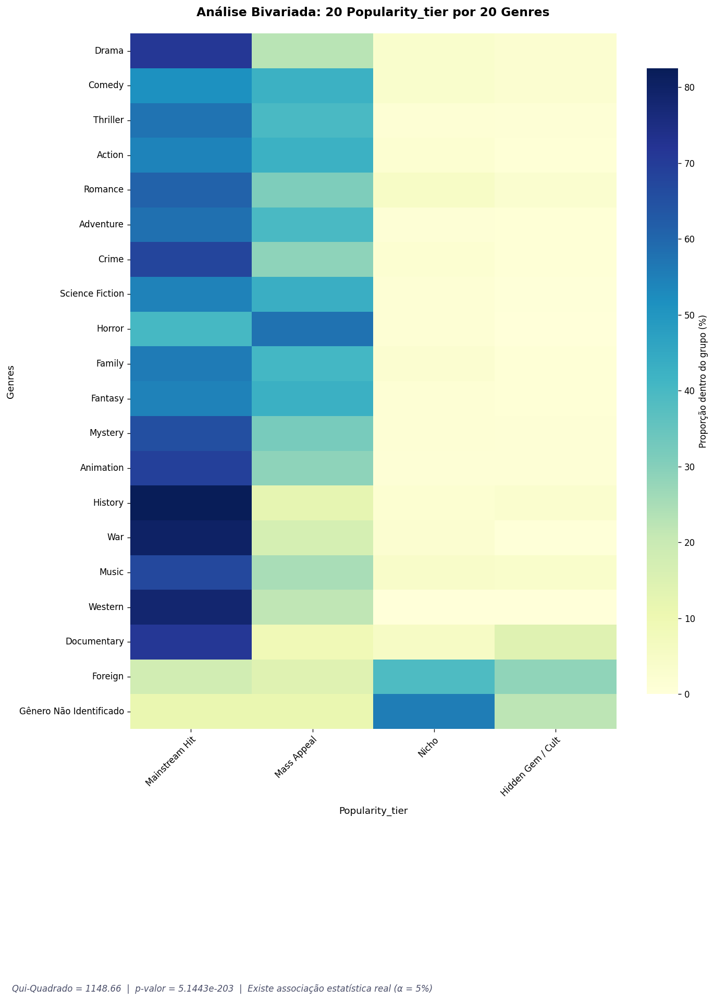

In [27]:
graf.grafico_dependencia_categorica(
    tabela_absoluta=contingencia_genres_popularity_tier,
    chi2=resultado_genres_popularity_tier['Qui-Quadrado'].iloc[0],
    p_valor=resultado_genres_popularity_tier['p-valor'].iloc[0],
    top_n=20
)

---
## Carregando Datasets Explodidos 

In [28]:
colunas_explodidas = ['genres', 'producer_company', 'production_countries', 'spoken_languages']
dfs_exploded = {}

for coluna in colunas_explodidas:
    nome = coluna.split('_')[-1]
    caminho = f'../data/interim/movies/movies_{nome}.parquet'
    dfs_exploded[nome] = dl.load_data(file_path=caminho, tipo_arquivo='parquet')
    # globals()[f'df_{nome}'] = dl.load_data(file_path=caminho, tipo_arquivo='parquet')
     

Dados Parquet carregados! Formato: (86933, 22)
Dados Parquet carregados! Formato: (77006, 22)
Dados Parquet carregados! Formato: (50882, 22)
Dados Parquet carregados! Formato: (52356, 22)


--- 
## Mitigação Temporária De Erros De Preenchimento

* Filtrando orçamentos e faturamentos irreais (**< 5 mil**) para evitar distorções severas nas análises relacionais e multivariadas.


In [29]:
for nome, df in dfs_exploded.items():

    filtro_valores_reais = (
        (df['budget'] >= 5_000) &
        (df['revenue'] >= 5_000)
    )

    dfs_exploded[nome] = df.loc[filtro_valores_reais].copy()

---
## Categórica VS Numérica

#### `genre` vs `global_score`

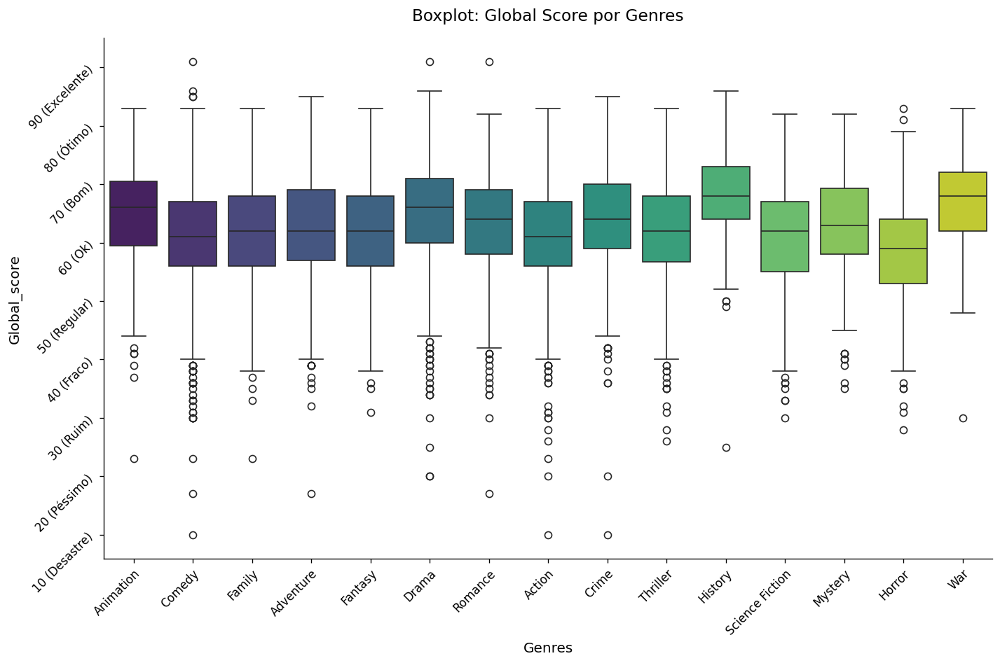

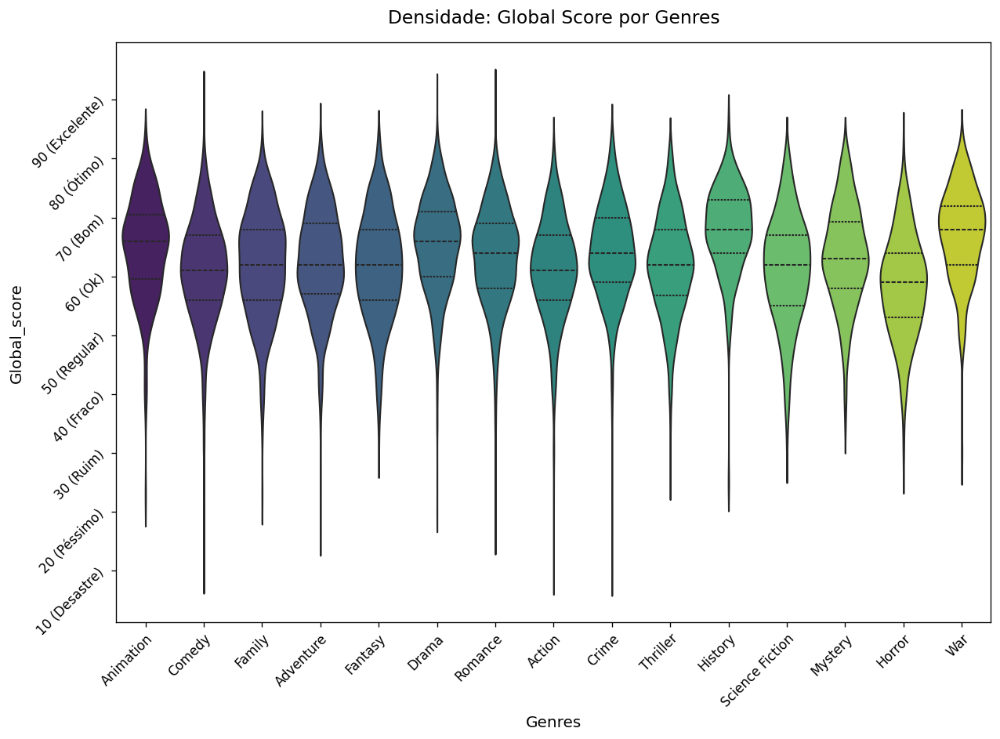

In [30]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='global_score',      
    top_n_cats=15,                 
    tipo_dado='nota_100'            
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='global_score',      
    top_n_cats=15,                 
    tipo_dado='nota_100'            
)

#### `genre` vs `revenue`

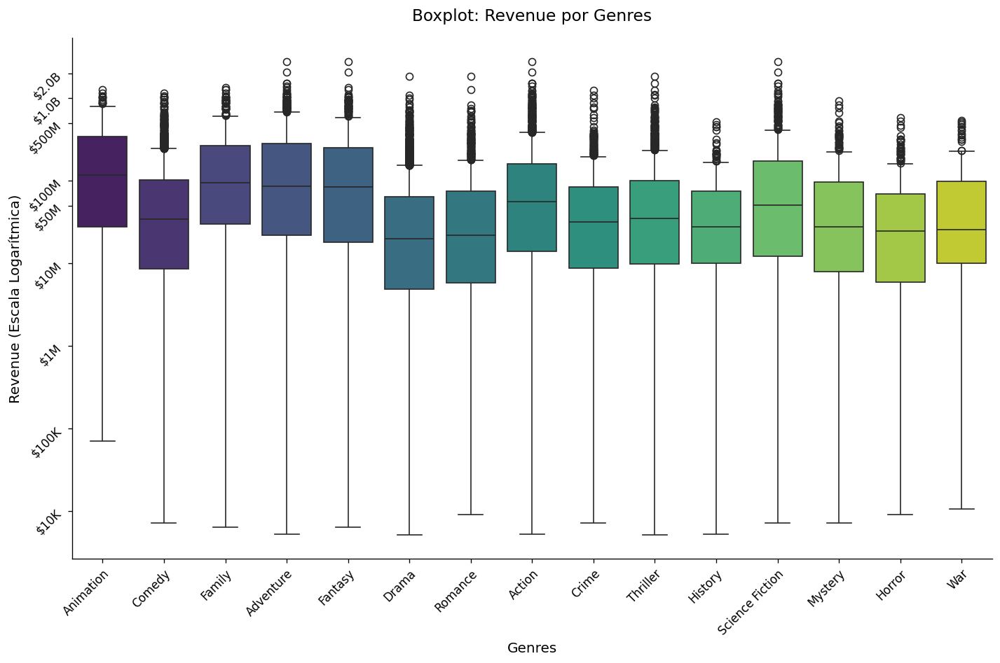

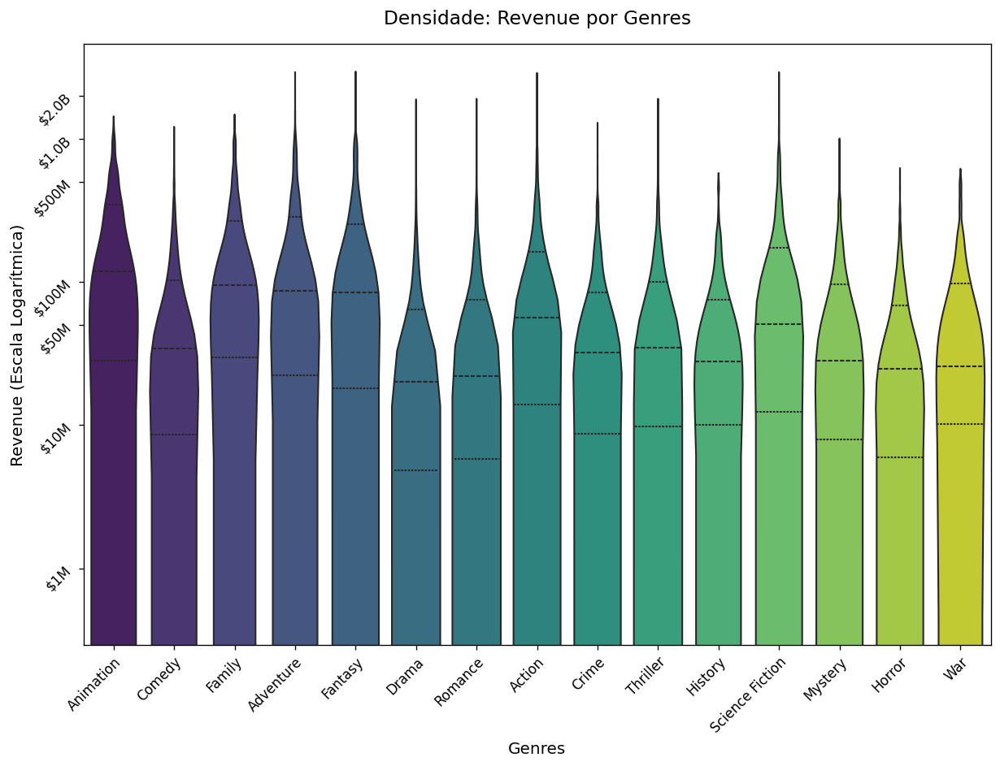

In [31]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='revenue',      
    top_n_cats=15,                 
    tipo_dado='moeda',
    usar_log=True            
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='revenue',      
    top_n_cats=15,                 
    tipo_dado='moeda',
    usar_log=True            
)

#### `genre` vs `budget`

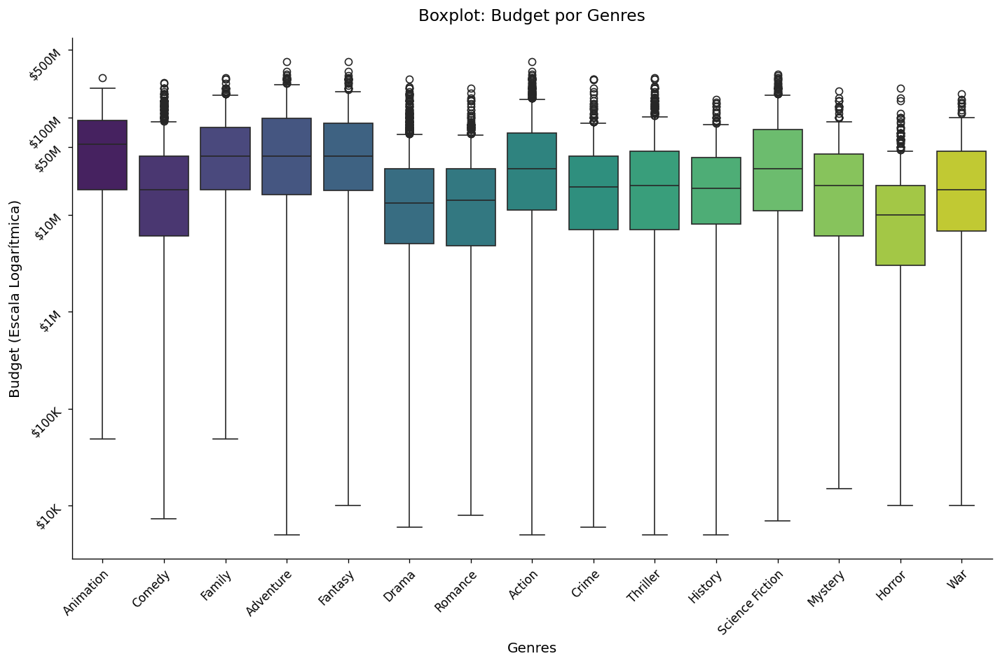

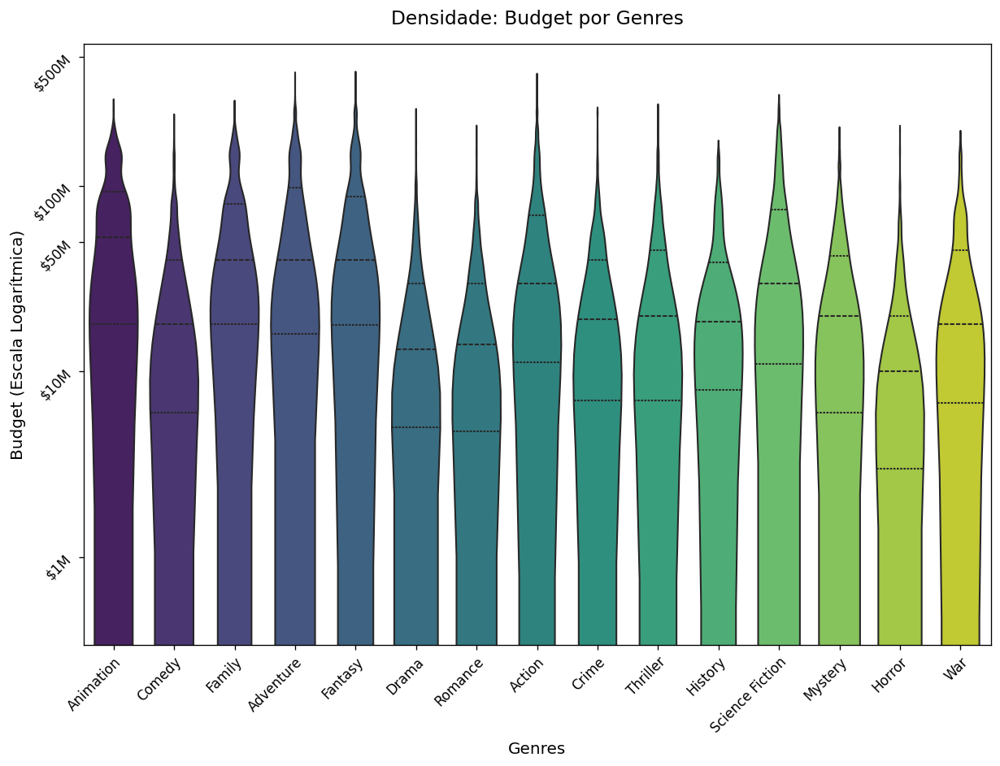

In [32]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='budget',      
    top_n_cats=15,                 
    tipo_dado='moeda',
    usar_log=True            
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='budget',      
    top_n_cats=15,                 
    tipo_dado='moeda',
    usar_log=True            
)

#### `genre` vs `runtime`

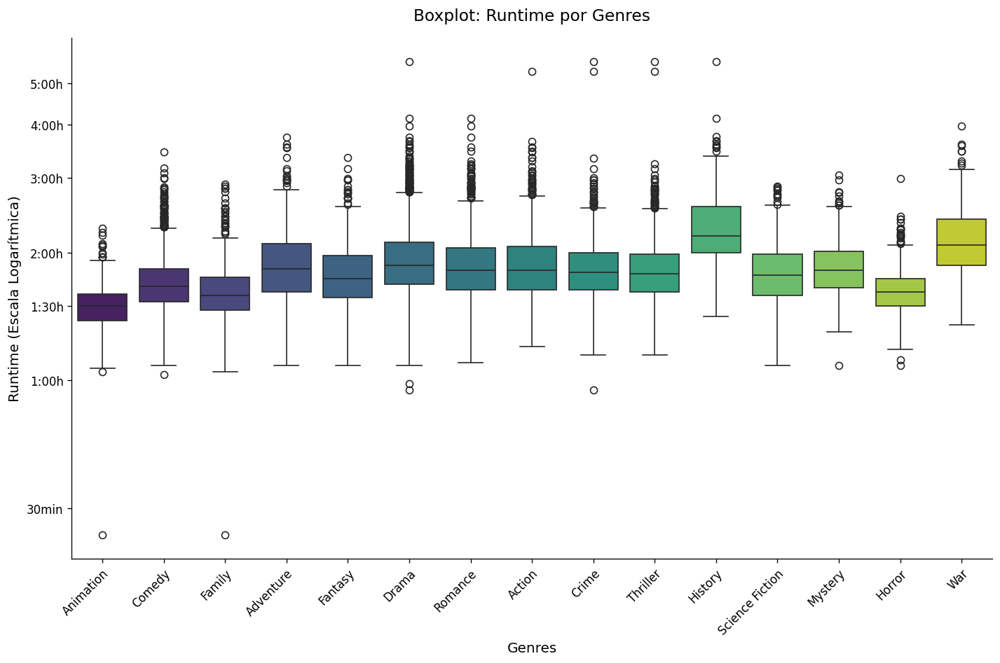

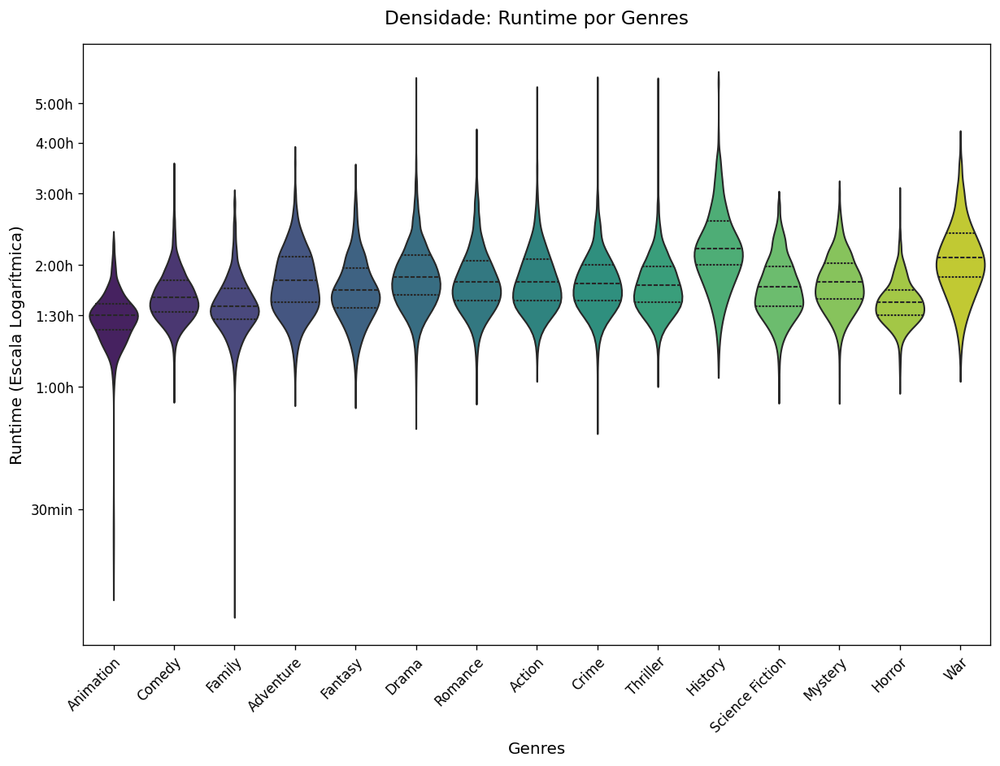

In [33]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='runtime',      
    top_n_cats=15,
    tipo_dado='hora_5h',                 
    usar_log=True            
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=dfs_exploded['genres'],              
    cat_col='genres',              
    num_col='runtime',      
    top_n_cats=15,
    tipo_dado='hora_5h',                 
    usar_log=True            
)

#### `decade` vs `runtime`

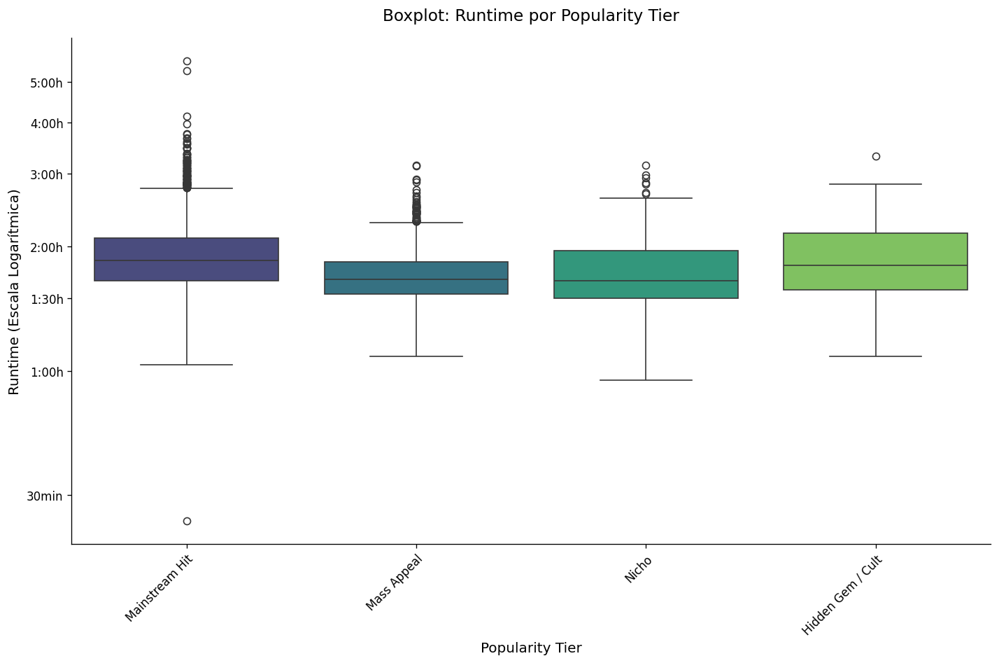

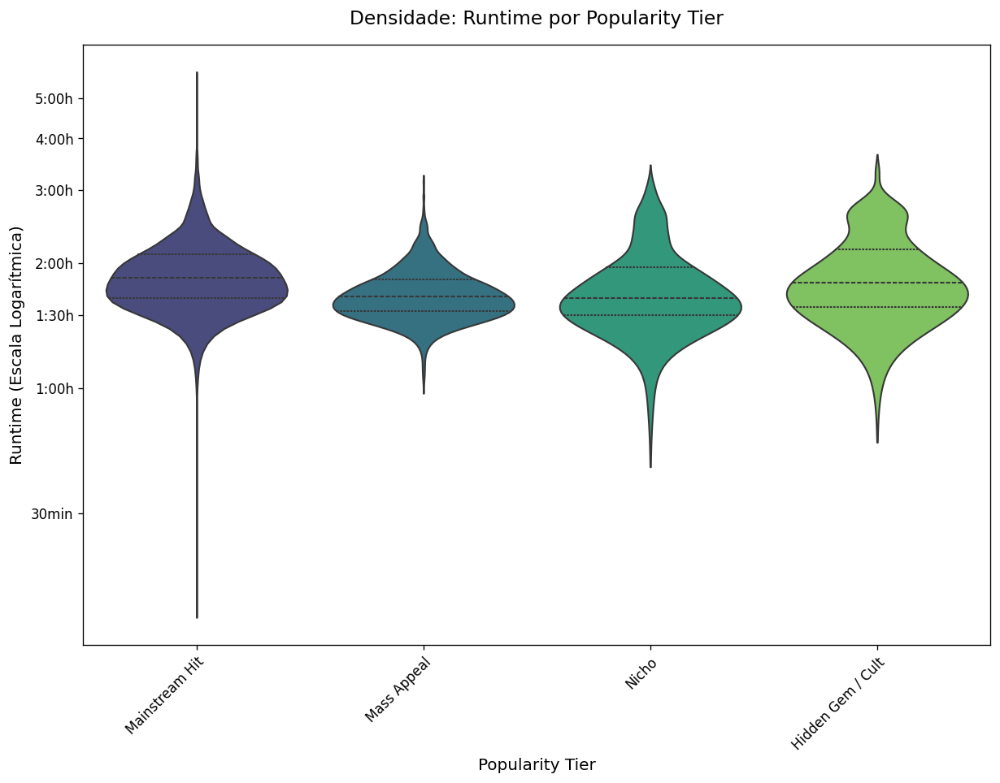

In [34]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=df_movies,              
    cat_col='popularity_tier',              
    num_col='runtime',      
    tipo_dado='hora_5h',                 
    usar_log=True            
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=df_movies,              
    cat_col='popularity_tier',              
    num_col='runtime',      
    tipo_dado='hora_5h',                 
    usar_log=True            
)

#### `popularity_tier` vs `global_score`

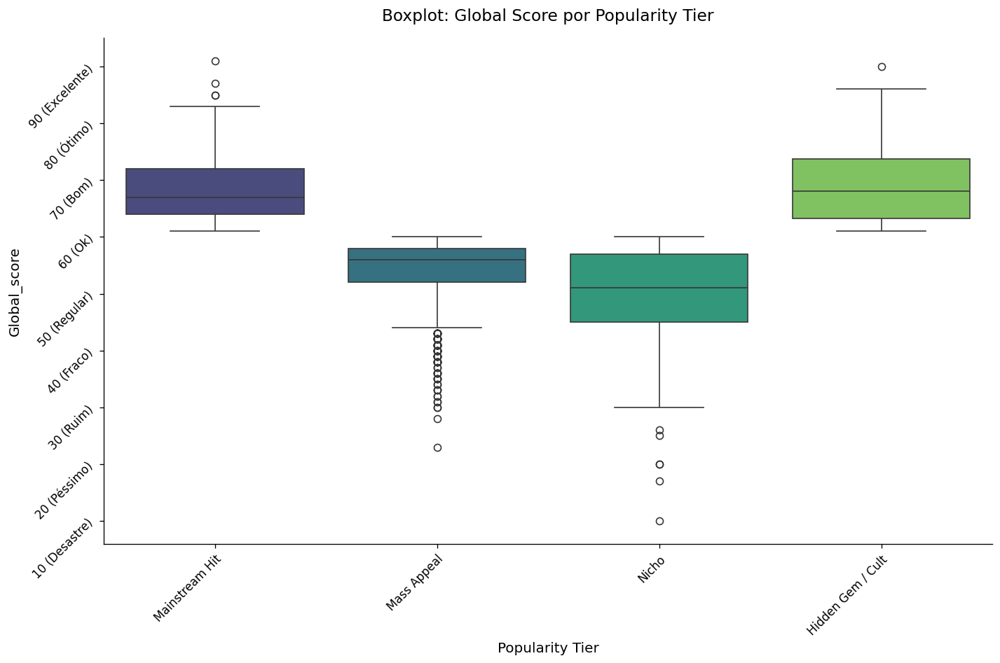

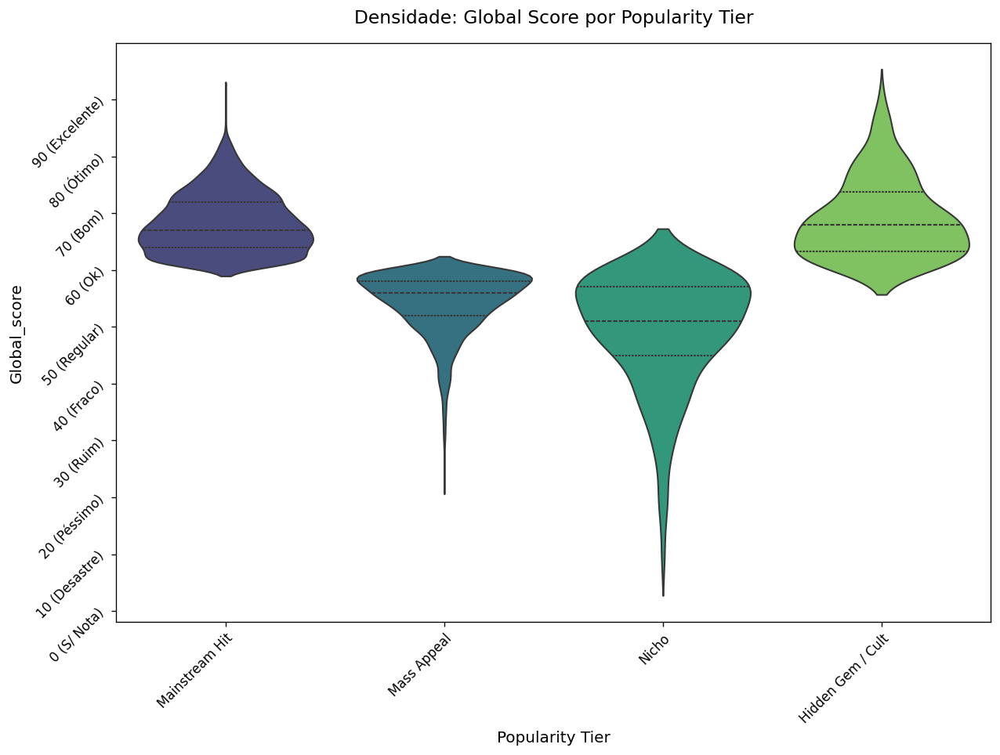

In [35]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=df_movies,              
    cat_col='popularity_tier',              
    num_col='global_score',      
    top_n_cats=15,
    tipo_dado='nota_100'       
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=df_movies,              
    cat_col='popularity_tier',              
    num_col='global_score',      
    top_n_cats=15,
    tipo_dado='nota_100'           
)

#### `producer_company` vs `votes_per_year`

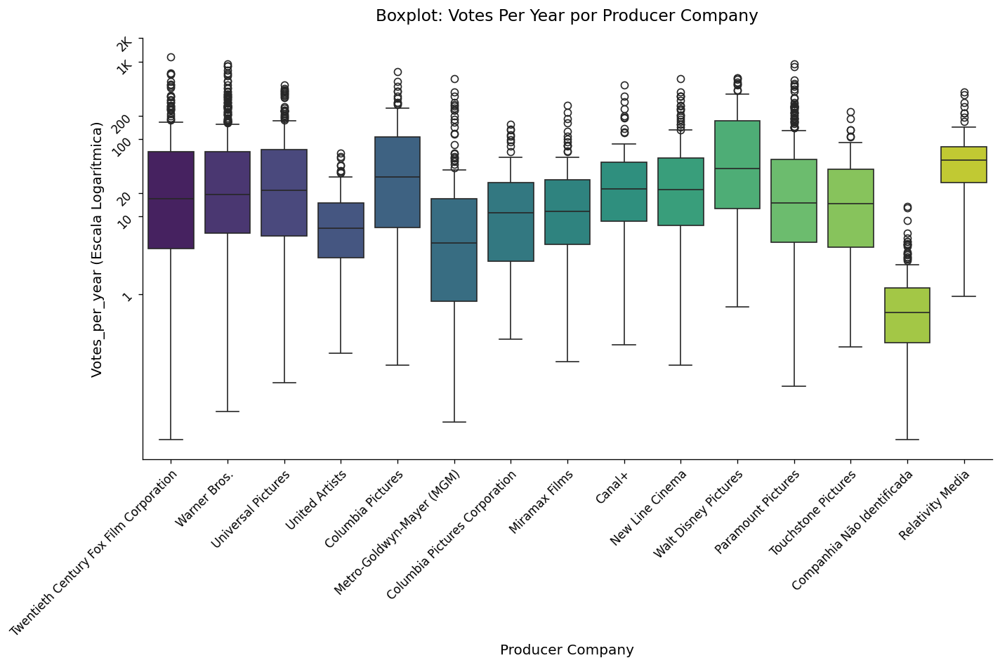

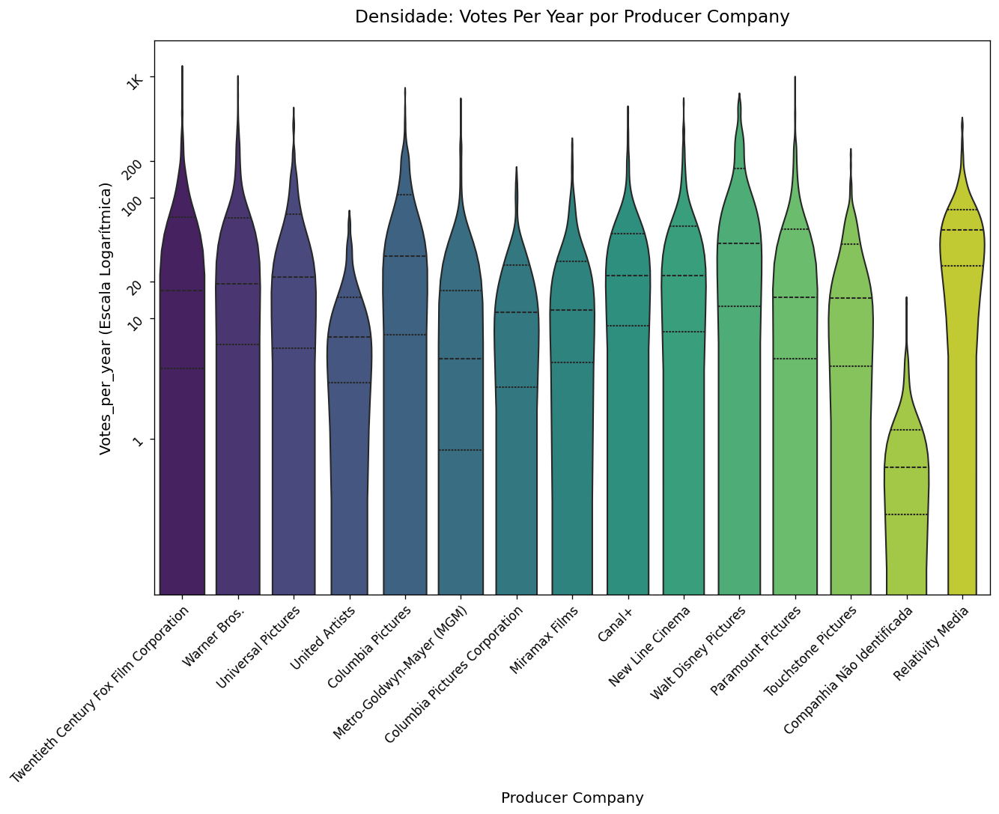

In [36]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=dfs_exploded['company'],              
    cat_col='producer_company',              
    num_col='votes_per_year',      
    top_n_cats=15,
    tipo_dado='contagem_dezena_milhar',                 
    usar_log=True            
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=dfs_exploded['company'],              
    cat_col='producer_company',              
    num_col='votes_per_year',      
    top_n_cats=15,
    tipo_dado='contagem_dezena_milhar',                 
    usar_log=True            
)

#### `original_language` vs `revenue`

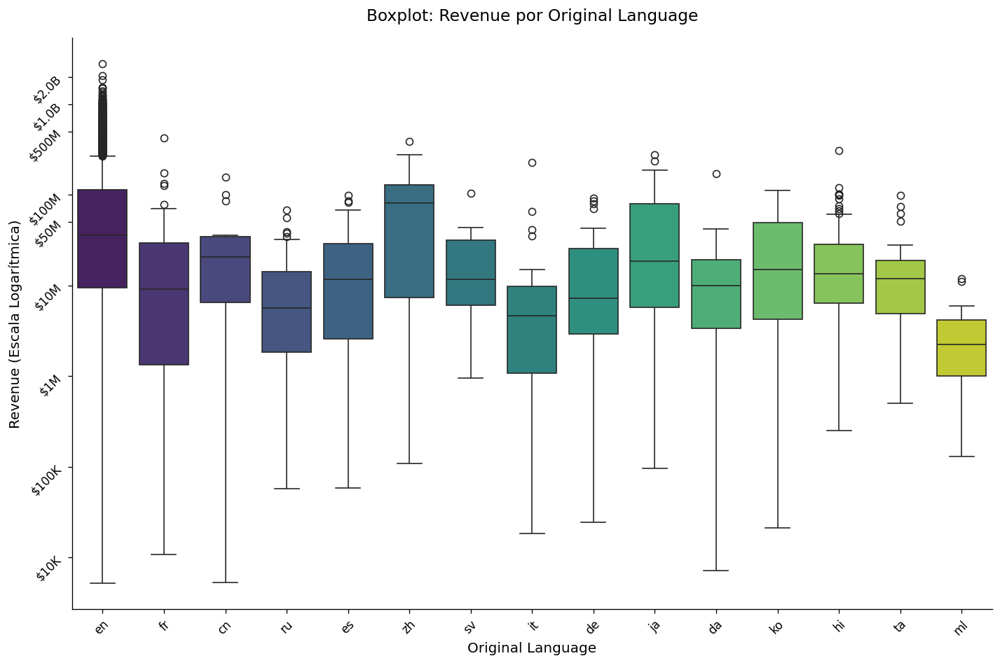

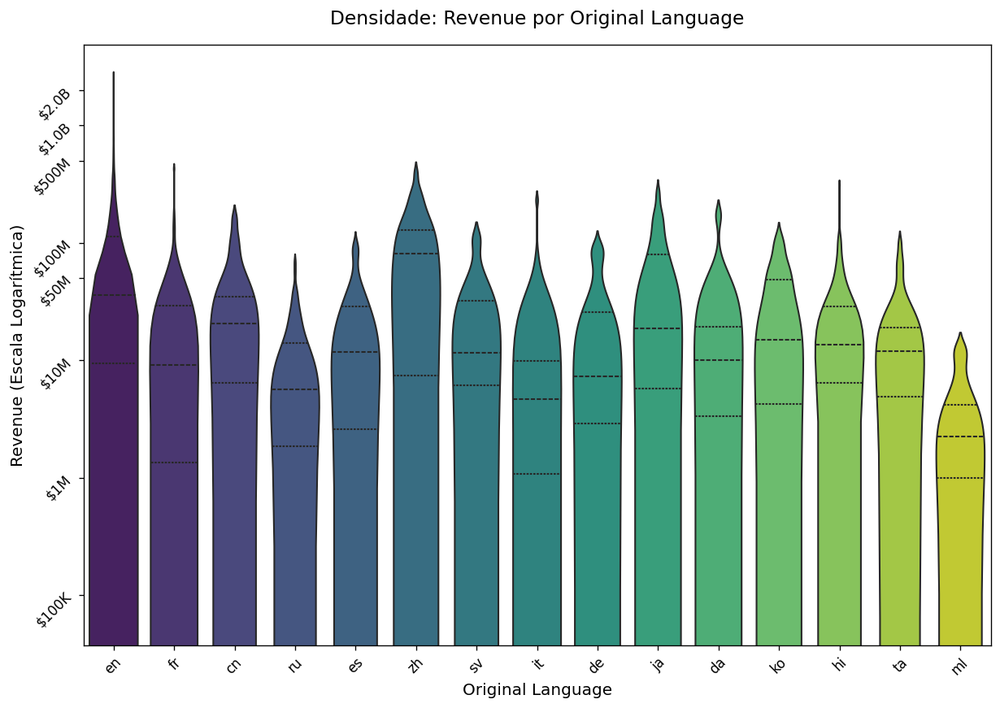

In [37]:
graf.grafico_cat_vs_num_boxplot(
    df_plot=df_movies,              
    cat_col='original_language',              
    num_col='revenue',      
    top_n_cats=15,
    tipo_dado='moeda',                 
    usar_log=True            
)

# Para plotar o Violinplot
graf.grafico_cat_vs_num_violinplot(
    df_plot=df_movies,              
    cat_col='original_language',              
    num_col='revenue',      
    top_n_cats=15,
    tipo_dado='moeda',                 
    usar_log=True            
)

# Conclusões da Análise Bivariada

A Análise Bivariada do dataset de filmes revelou os bastidores de Hollywood, demonstrando como o capital injetado dita o engajamento e evidenciando os padrões de produção em massa dos grandes estúdios.

### Relações Numéricas (N vs N)
* **O Capital dita a Conversa:** A correlação de Pearson mostra uma ligação forte (0.78) entre a receita do filme (`revenue`) e o volume total de votos/engajamento (`total_votes`). O orçamento (`budget`) também pesa consideravelmente (0.61). Em Hollywood, campanhas bilionárias de marketing garantem que o filme será discutido, independentemente de sua qualidade final.
* **Qualidade vs. Tempo de Tela:** Assim como na literatura, a correlação entre a duração do filme (`runtime`) e sua nota é muito baixa (0.10). Filmes épicos de 3 horas não são intrinsecamente melhor avaliados do que obras de 90 minutos.

###  Categóricas vs Numéricas (C vs N)
* **A Supremacia Financeira de Hollywood:** O cruzamento do idioma original (`original_language`) com receita e orçamento (`revenue`/`budget`) via gráficos logarítmicos atesta o monopólio americano. Produções em inglês operam em um patamar de capital logaritmicamente superior às produções asiáticas e europeias, ditando o ritmo do mercado global.
* **A Guerra da Sustentação (Estúdios vs. Engajamento):** Avaliando o Top 10 `producer_company` contra a métrica `votes_per_year`, é possível visualizar visualmente quais estúdios (como Pixar/Disney) criam obras que continuam sendo ativamente avaliadas anos após o lançamento, e quais produzem filmes descartáveis que sofrem queda rápida no engajamento.
* **Padrões Rígidos de Duração:** O cruzamento de `genres` com `runtime` expõe a "fórmula" da indústria. Comédias e Animações estão rigidamente presas no intervalo de 90 a 105 minutos (caixas do boxplot extremamente curtas e sem variância), enquanto Dramas apresentam alta dispersão de tempo.

### Relações Categóricas (C vs C)
* **Monopólio de Nicho por Estúdio:** O teste Qui-Quadrado cruzando estúdios e gêneros confirma que a dependência é real. Estúdios milionários não apostam em todos os gêneros; eles concentram massivamente seus orçamentos em 1 ou 2 vertentes garantidas (como Ação e Aventura), transformando a diversificação em uma métrica de risco que eles preferem evitar.